# PROJECT 496  : Electric Motor Temperature

Project Objective: Predict Motor Speed based on other attributes available

The dataset comprises several sensor data collected from a permanent magnet synchronous motor (PMSM) deployed on a test bench. The PMSM represents a ccTest bench measurements were collected by the LEA department at Paderborn University. This dataset is mildly anonymized.
All recordings are sampled at 2 Hz. The dataset consists of multiple measurement sessions, which can be distinguished from each other by the column "profile_id". A measurement session can be between one and six hours long. The motor is excited by hand-designed driving cycles denoting a reference motor speed and a reference torque. Currents in d/q-coordinates (columns "i_d" and i_q") and voltages in d/q-coordinates (columns "u_d" and "u_q") are a result of a standard control strategy trying to follow the reference speed and torque. Columns "motor_speed" and "torque" are the resulting quantities achieved by that strategy, derived from set currents and voltages. Most driving cycles denote random walks in the speed-torque-plane in order to imitate real world driving cycles to a more accurate degree than constant excitations and ramp-ups and -downs would.

In [3]:
#importing necessary libraries for building the project

#basic libraries
import pandas as pd
import numpy as np
import scipy
import seaborn as sns
from sklearn import preprocessing
from sklearn import metrics
import matplotlib.pyplot as plt
#print(plt.style.available) #here
#plt.style.use('seaborn-darkgrid')
plt.style.use("seaborn-v0_8-darkgrid") #upgraded
%matplotlib inline

#import library for linear rigression model
import statsmodels.formula.api as smf


#import library for splitting the data into training and testing data
from sklearn.model_selection import train_test_split

#import library for Decision Tree model
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from sklearn.tree import plot_tree
from sklearn.model_selection import GridSearchCV

#import library for Random Forest model
from sklearn.ensemble import RandomForestRegressor

#import library for Ada boost Regressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import RandomizedSearchCV

#import library for Gradient Boost regressor
from sklearn.ensemble import GradientBoostingRegressor

#import library for Bagging Regressor Model
from sklearn.ensemble import BaggingRegressor
from scipy.stats import uniform, randint


#import library for avoid warinings
import warnings
warnings.filterwarnings("ignore")

In [7]:
data=pd.read_csv("temperature_data.csv")

In [8]:
data.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


 We have to predict the motor speed based on other attributes available in the dataset.From data provided, it seems like this is a regression problem. In a regression problem, the goal is to predict a continuous value (in this case, the motor speed) given a set of inputs (other attributes in the dataset).

The standard approach for this regression problem would be to use a machine learning model to make predictions about the motor speed based on the other attributes in the dataset. The process typically involves the following steps:

1-Data Exploration: This includes visualizing the data, identifying patterns, and understanding the relationships between the features and the target variable.

2-Data Preparation: This includes cleaning the data, dealing with missing values, and normalizing the features.

3-Model Selection: Selecting an appropriate model that can learn the relationship between the features and the target variable. Some popular models for regression problems include linear regression, decision trees, and random forests.

4-Model Training: Train the selected model on the prepared data.

5-Model Evaluation: Evaluating the model's performance on the training data. This is done using metrics such as mean squared error, mean absolute error, and R-squared.

6-Model Optimization: Optimizing the model by fine-tuning the parameters and feature selection.

7-Model Deployment: Once the model has been optimized, it can be deployed to make predictions on new, unseen data.

# Data Exploration and EDA

In [11]:
#displayiong last 5 rows of data
data.tail()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.25564,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.25564,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.25564,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.25564,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72
998069,-0.043803,0.312666,0.330830,-1.246590,-1.222431,-0.25564,1.029141,-0.245722,0.429166,0.987163,0.828046,0.489382,72


In [13]:
#renaming the variables for readability
data.rename(columns={'ambient' : 'Ambient','coolant':'Coolant','u_d': 'Voltage_D_component','u_q':'Voltage_Q_component',
                     'motor_speed': 'Motor_Speed','torque':'Torque','i_d':'Current_D_component','i_q':'Current_Q_component',
                    'pm':'PMST','stator_yoke':'Stator_Yoke','stator_tooth':"Stator_Tooth",'stator_winding':'Stator_Winding',
                    "profile_id":"Profile_ID"},inplace=True)

In [15]:
#displaying names of the columns data.columns
data.columns

Index(['Ambient', 'Coolant', 'Voltage_D_component', 'Voltage_Q_component',
       'Motor_Speed', 'Torque', 'Current_D_component', 'Current_Q_component',
       'PMST', 'Stator_Yoke', 'Stator_Tooth', 'Stator_Winding', 'Profile_ID'],
      dtype='object')

# Modification for splitting of the data

In [19]:
New_Data=data[['Motor_Speed','Ambient', 'Coolant', 'Voltage_D_component', 'Voltage_Q_component',
               'Torque', 'Current_D_component', 'Current_Q_component','PMST', 'Stator_Yoke',
               'Stator_Tooth', 'Stator_Winding', 'Profile_ID']]

In [22]:
New_Data

,Motor_Speed,Ambient,Coolant,Voltage_D_component,Voltage_Q_component,Torque,Current_D_component,Current_Q_component,PMST,Stator_Yoke,Stator_Tooth,Stator_Winding,Profile_ID
0,-1.222428,-0.752143,-1.118446,0.327935,-1.297858,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-1.222429,-0.771263,-1.117021,0.329665,-1.297686,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-1.222428,-0.782892,-1.116681,0.332771,-1.301822,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-1.222430,-0.780935,-1.116764,0.333700,-1.301852,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-1.222429,-0.774043,-1.116775,0.335206,-1.303118,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-1.222428,-0.047497,0.341638,0.331475,-1.246114,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-1.222437,-0.048839,0.320022,0.331701,-1.250655,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-1.222430,-0.042350,0.307415,0.330946,-1.246852,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-1.222432,-0.039433,0.302082,0.330987,-1.249505,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


In [24]:
# returns the dimensions of the DataFrame as a tuple (number of rows, number of columns).
New_Data.shape

(998070, 13)

In [26]:
#display a concise summary of the New_Data DataFrame
New_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Motor_Speed          998070 non-null  float64
 1   Ambient              998070 non-null  float64
 2   Coolant              998070 non-null  float64
 3   Voltage_D_component  998070 non-null  float64
 4   Voltage_Q_component  998070 non-null  float64
 5   Torque               998070 non-null  float64
 6   Current_D_component  998070 non-null  float64
 7   Current_Q_component  998070 non-null  float64
 8   PMST                 998070 non-null  float64
 9   Stator_Yoke          998070 non-null  float64
 10  Stator_Tooth         998070 non-null  float64
 11  Stator_Winding       998070 non-null  float64
 12  Profile_ID           998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


In [28]:
#checks for duplicate rows in the New_Data DataFrame
New_Data.duplicated().sum()

0

In [30]:
#provides summary statistics (like mean, median, min, max, etc.) for numerical columns in the DataFrame.
New_Data.describe()

,Motor_Speed,Ambient,Coolant,Voltage_D_component,Voltage_Q_component,Torque,Current_D_component,Current_Q_component,PMST,Stator_Yoke,Stator_Tooth,Stator_Winding,Profile_ID
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.006336,-0.003905,0.004723,0.004780,-0.005690,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,1.001229,0.993127,1.002423,0.997878,1.002330,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-1.371529,-8.573954,-1.429349,-1.655373,-1.861463,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.951892,-0.599385,-1.037925,-0.826359,-0.927390,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,-0.140246,0.266157,-0.177187,0.267542,-0.099818,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.853584,0.686675,0.650709,0.358491,0.852625,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.024164,2.967117,2.649032,2.274734,1.793498,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


In [32]:
New_Data.corr()

,Motor_Speed,Ambient,Coolant,Voltage_D_component,Voltage_Q_component,Torque,Current_D_component,Current_Q_component,PMST,Stator_Yoke,Stator_Tooth,Stator_Winding,Profile_ID
Motor_Speed,1.000000,0.078283,-0.033332,-0.233828,0.716897,0.024517,-0.722914,0.006323,0.332419,0.182564,0.333909,0.393154,-0.166225
Ambient,0.078283,1.000000,0.434435,0.194754,0.087430,-0.262264,0.005605,-0.260562,0.501496,0.451616,0.396742,0.301883,0.384565
Coolant,-0.033332,0.434435,1.000000,0.178708,0.027851,-0.189617,0.108489,-0.186060,0.430548,0.874037,0.689003,0.509298,0.499669
Voltage_D_component,-0.233828,0.194754,0.178708,1.000000,-0.027472,-0.821325,0.358517,-0.796586,-0.082564,0.041428,-0.066256,-0.150714,0.300771
Voltage_Q_component,0.716897,0.087430,0.027851,-0.027472,1.000000,-0.037262,-0.181855,-0.026348,0.101236,0.106186,0.149017,0.125445,-0.122260
Torque,0.024517,-0.262264,-0.189617,-0.821325,-0.037262,1.000000,-0.239059,0.996560,-0.072905,-0.092207,-0.011055,0.080981,-0.257446
Current_D_component,-0.722914,0.005605,0.108489,0.358517,-0.181855,-0.239059,1.000000,-0.204230,-0.299227,-0.179903,-0.387712,-0.539924,0.142368
Current_Q_component,0.006323,-0.260562,-0.186060,-0.796586,-0.026348,0.996560,-0.204230,1.000000,-0.086486,-0.098753,-0.025191,0.060949,-0.256127
PMST,0.332419,0.501496,0.430548,-0.082564,0.101236,-0.072905,-0.299227,-0.086486,1.000000,0.695014,0.768352,0.729561,0.156735
Stator_Yoke,0.182564,0.451616,0.874037,0.041428,0.106186,-0.092207,-0.179903,-0.098753,0.695014,1.000000,0.949898,0.845144,0.398021


<Axes: >

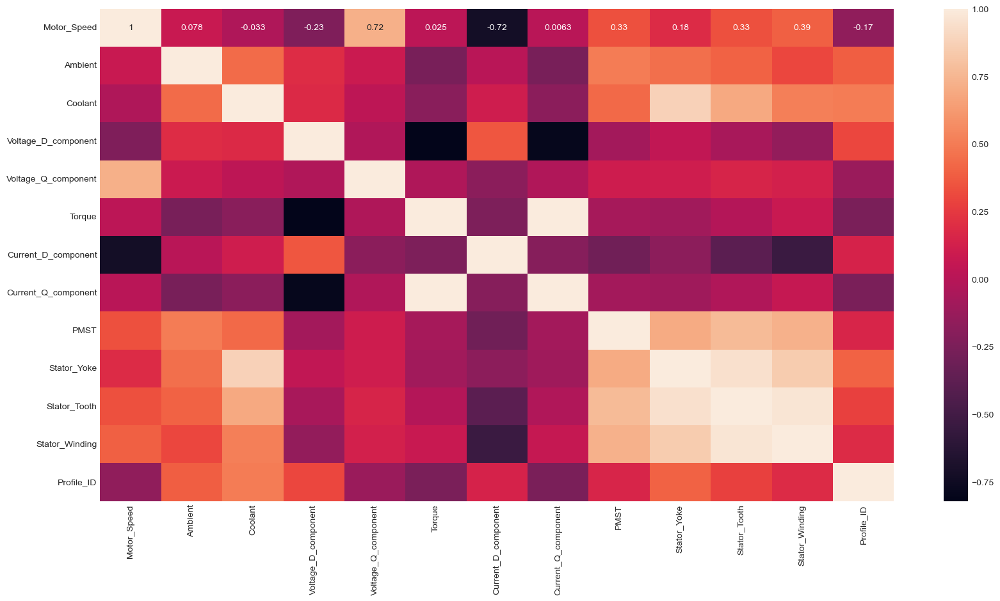

In [34]:
#Heatmap to show correlation between various features
plt.figure(figsize=(20,10))
sns.heatmap(New_Data.corr(),annot=True,color="white")

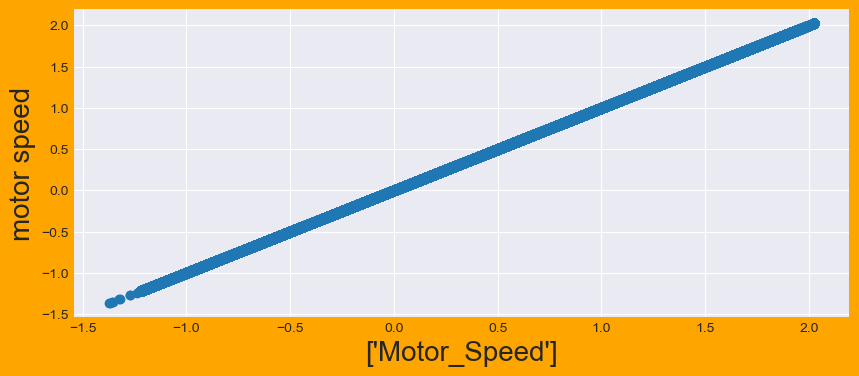

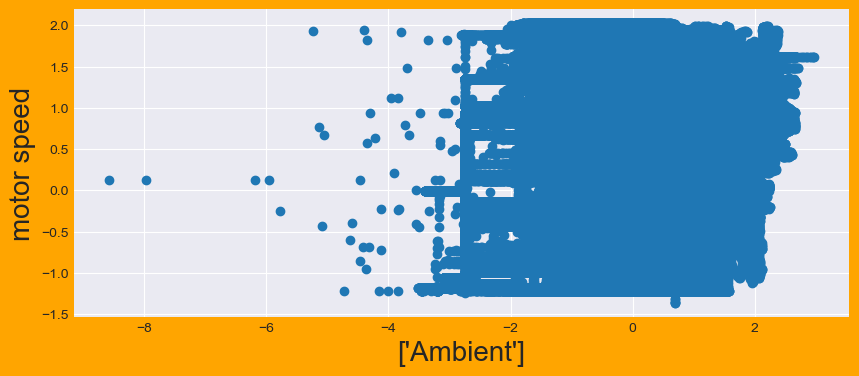

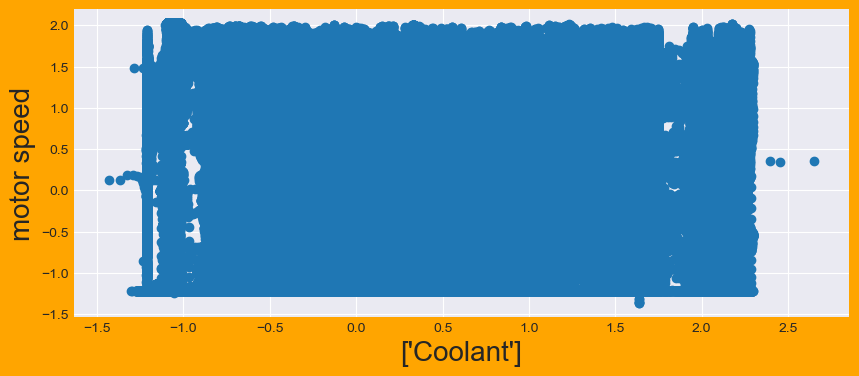

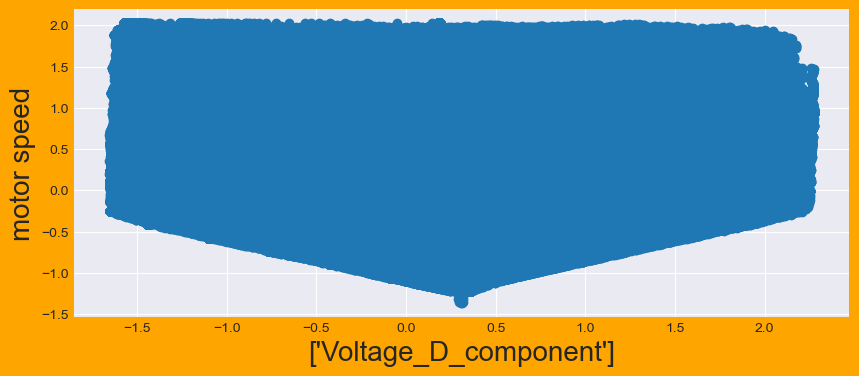

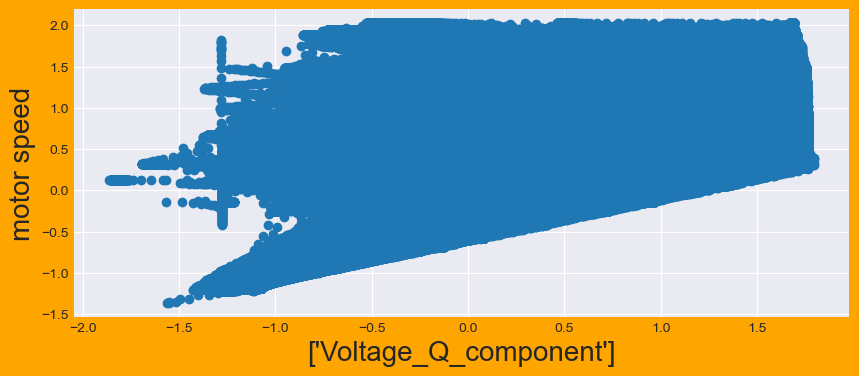

...

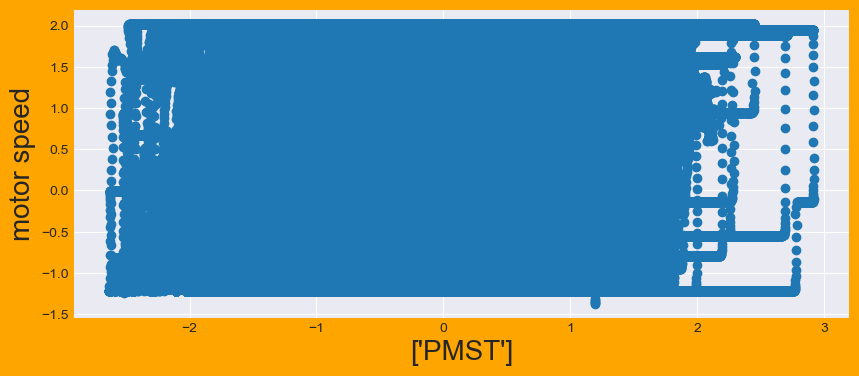

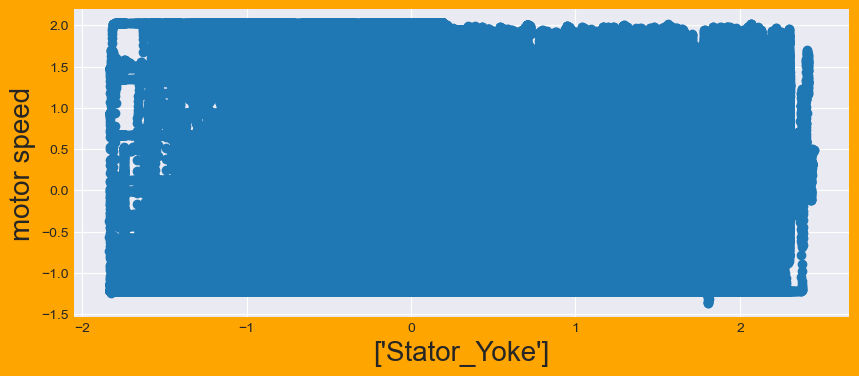

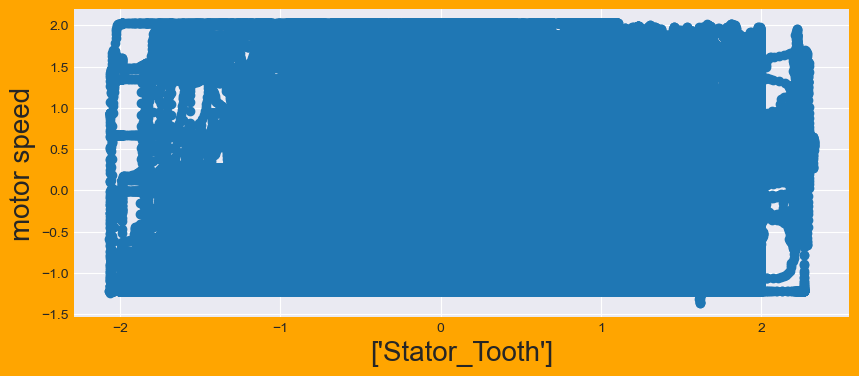

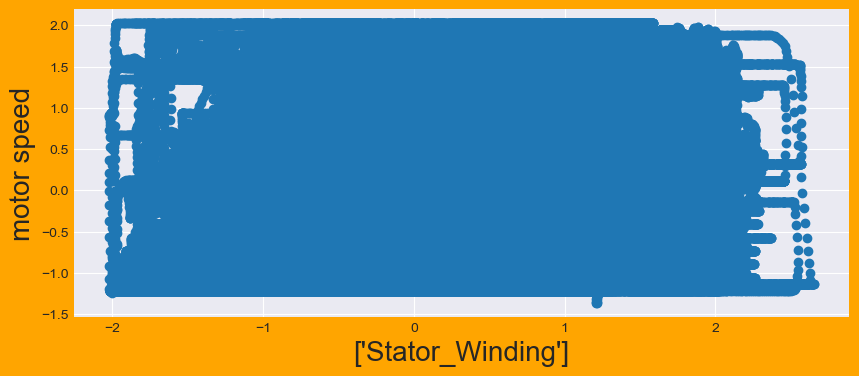

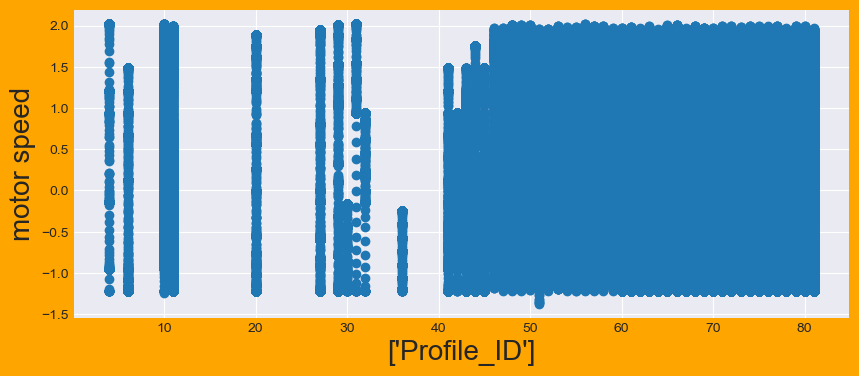

In [37]:
# let's plot all the columns to look at their distributions to show relationship between motor speed and other variables 
#H=['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed', 'torque', 'i_d','i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding','profile_id']
for i in New_Data.columns:
    plt.figure(figsize=(10, 4),facecolor="orange")
    plt.scatter(data[i],New_Data["Motor_Speed"])
    plt.xlabel([i], size=20)
    plt.ylabel('motor speed',size=20)
    plt.show()

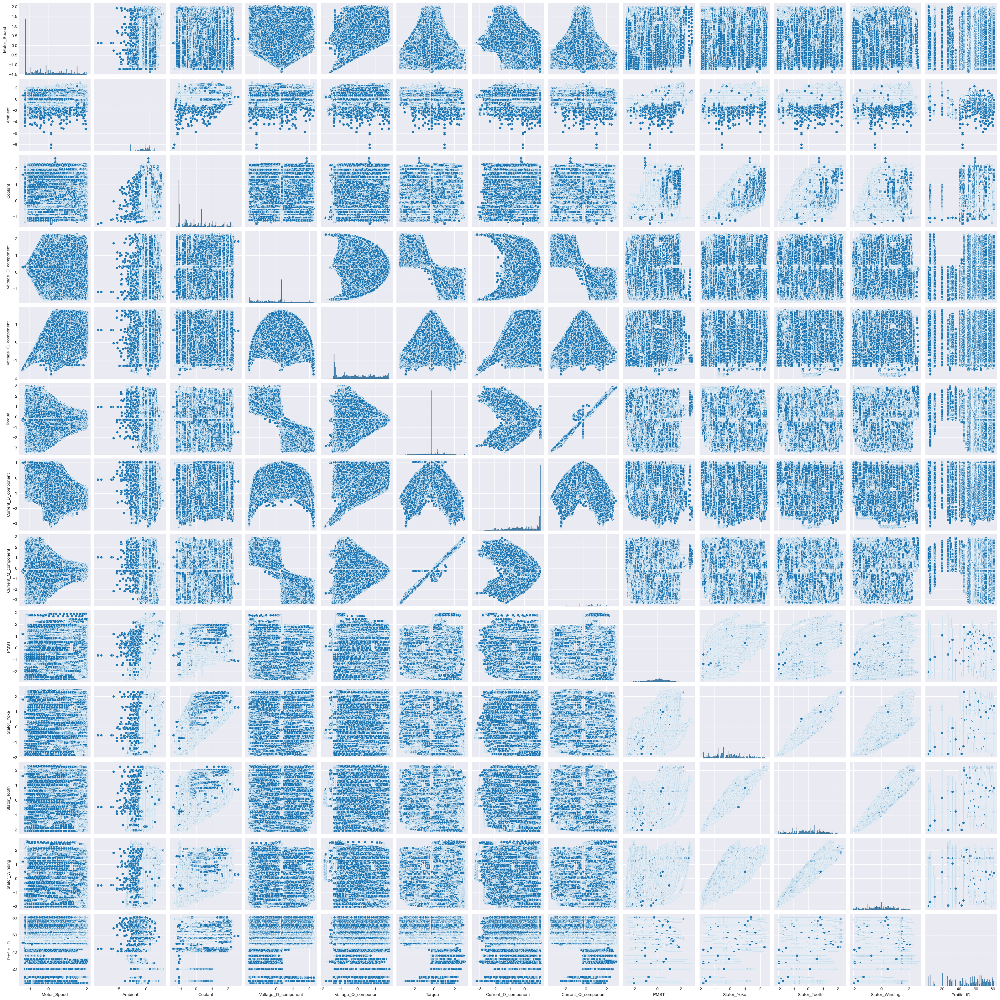

In [43]:
sns.pairplot(New_Data)

VIF Calculation

In [94]:
rsq_Ambient = smf.ols("Ambient ~ Coolant + Voltage_D_component + Voltage_Q_component + Torque + Current_D_component + Current_Q_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Ambient = 1/(1-rsq_Ambient)

rsq_Coolant = smf.ols("Coolant ~ Ambient + Voltage_D_component + Voltage_Q_component + Torque + Current_D_component + Current_Q_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Coolant = 1/(1-rsq_Coolant)

rsq_Voltage_D_component = smf.ols("Voltage_D_component ~ Ambient + Coolant + Voltage_Q_component + Torque + Current_D_component + Current_Q_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Voltage_D_component = 1/(1-rsq_Voltage_D_component)

rsq_Voltage_Q_component = smf.ols("Voltage_Q_component ~ Ambient + Coolant + Voltage_D_component + Torque + Current_D_component + Current_Q_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Voltage_Q_component = 1/(1-rsq_Voltage_Q_component)

rsq_Torque = smf.ols("Torque ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Current_D_component + Current_Q_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Torque = 1/(1-rsq_Torque)

rsq_Current_Q_component = smf.ols("Current_Q_component ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_D_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Current_Q_component = 1/(1-rsq_Current_Q_component)

rsq_Current_D_component = smf.ols("Current_D_component ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_Q_component + PMST + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Current_D_component = 1/(1-rsq_Current_D_component)

rsq_PMST = smf.ols("PMST ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_Q_component + Current_D_component + Stator_Yoke + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_PMST = 1/(1-rsq_PMST)

rsq_Stator_Yoke = smf.ols("Stator_Yoke ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_Q_component + Current_D_component + PMST + Stator_Tooth + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Stator_Yoke = 1/(1-rsq_Stator_Yoke)

rsq_Stator_Tooth = smf.ols("Stator_Tooth ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_Q_component + Current_D_component + PMST + Stator_Yoke + Stator_Winding+ Profile_ID", data=data).fit().rsquared
vif_Stator_Tooth = 1/(1-rsq_Stator_Tooth)

rsq_Stator_Winding = smf.ols("Stator_Winding ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_Q_component + Current_D_component + PMST + Stator_Yoke + Stator_Tooth + Profile_ID", data=data).fit().rsquared
vif_Stator_Winding = 1/(1-rsq_Stator_Winding)

rsq_Profile_ID = smf.ols("Profile_ID ~ Ambient + Coolant + Voltage_Q_component + Voltage_Q_component + Torque + Current_Q_component + Current_D_component + PMST + Stator_Yoke + Stator_Winding+ Stator_Tooth", data=data).fit().rsquared
vif_Profile_ID = 1/(1-rsq_Profile_ID)

In [96]:
VIF= {"Variables":['Ambient','Coolant','Voltage_D_component','Voltage_Q_component','Torque','Current_Q_component','Current_D_component','PMST','Stator_Yoke','Stator_Winding','Stator_Tooth','Profile_ID'],
      'VIF':[vif_Ambient, vif_Coolant, vif_Voltage_D_component, vif_Voltage_Q_component, vif_Torque, vif_Current_Q_component, vif_Current_D_component, vif_PMST, vif_Stator_Yoke, vif_Stator_Winding, vif_Stator_Tooth, vif_Profile_ID]}
VIF_df = pd.DataFrame(VIF)
VIF_df

,Variables,VIF
0,Ambient,1.688646
1,Coolant,39.402307
2,Voltage_D_component,4.759660
3,Voltage_Q_component,1.519728
4,Torque,193.483442
5,Current_Q_component,189.868569
6,Current_D_component,2.939579
7,PMST,4.247227
8,Stator_Yoke,356.752414
9,Stator_Winding,146.668203


In [98]:
VIF_df[VIF_df.VIF>10]

,Variables,VIF
1,Coolant,39.402307
4,Torque,193.483442
5,Current_Q_component,189.868569
8,Stator_Yoke,356.752414
9,Stator_Winding,146.668203
10,Stator_Tooth,606.911896


In [100]:
len(VIF_df[VIF_df.VIF>10])

6

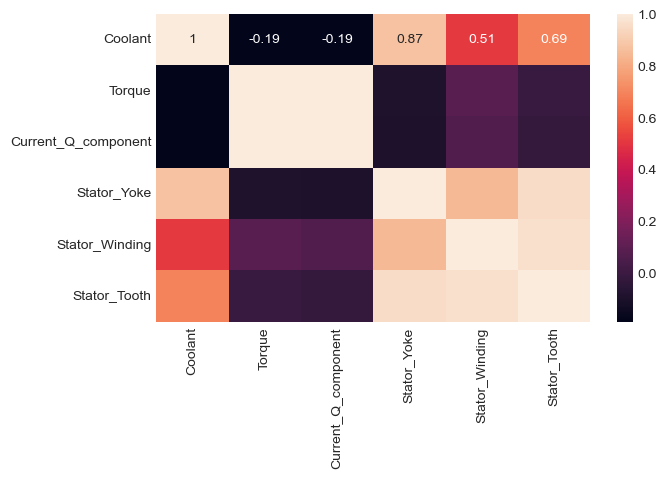

In [102]:
plt.figure(figsize=(7,4))
sns.heatmap(New_Data[["Coolant","Torque","Current_Q_component","Stator_Yoke","Stator_Winding","Stator_Tooth"]].corr(),annot=True,color="white")
plt.show()

In [104]:
final_Data=New_Data.copy()

In [106]:
final_Data=final_Data.drop(columns=['Torque','Stator_Yoke','Stator_Tooth'],axis=1)
final_Data

,Motor_Speed,Ambient,Coolant,Voltage_D_component,Voltage_Q_component,Current_D_component,Current_Q_component,PMST,Stator_Winding,Profile_ID
0,-1.222428,-0.752143,-1.118446,0.327935,-1.297858,1.029572,-0.245860,-2.522071,-2.018033,4
1,-1.222429,-0.771263,-1.117021,0.329665,-1.297686,1.029509,-0.245832,-2.522418,-2.017631,4
2,-1.222428,-0.782892,-1.116681,0.332771,-1.301822,1.029448,-0.245818,-2.522673,-2.017343,4
3,-1.222430,-0.780935,-1.116764,0.333700,-1.301852,1.032845,-0.246955,-2.521639,-2.017632,4
4,-1.222429,-0.774043,-1.116775,0.335206,-1.303118,1.031807,-0.246610,-2.521900,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...
998065,-1.222428,-0.047497,0.341638,0.331475,-1.246114,1.029142,-0.245723,0.429853,0.494725,72
998066,-1.222437,-0.048839,0.320022,0.331701,-1.250655,1.029148,-0.245736,0.429751,0.494279,72
998067,-1.222430,-0.042350,0.307415,0.330946,-1.246852,1.029191,-0.245701,0.429439,0.492666,72
998068,-1.222432,-0.039433,0.302082,0.330987,-1.249505,1.029147,-0.245727,0.429558,0.490581,72


In [108]:
#From above vif observation we came to the conclusion that out of 13 features 7 features are independent of each other and 
#remaining 6  features are dependent on each other so we for optimized result we will reselect the features for our model

After completing the EDA, we got better understanding of our dataset and the relationships between the features. Based on this understanding, now we can choose an appropriate model for our problem.

# Model Building
Linear Regression
Building Model with selected features

In [112]:
model0 = smf.ols("Motor_Speed ~ Ambient+Coolant + Voltage_D_component + Voltage_Q_component + Current_D_component + Current_Q_component + PMST  + Stator_Winding", data=final_Data).fit()

In [114]:
model0.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Motor_Speed   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                 1.412e+06
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        08:51:24   Log-Likelihood:            -1.6445e+05
No. Observations:              998070   AIC:                         3.289e+05
Df Residuals:                  998061   BIC:                         3.290e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.0007      0.000      2.597      0.009       0.000       0.001
Ambient                -0.0537      0.000   -148.145      0.000      -0.054      -0.053
Coolant                 0.0495      0.000    120.202      0.000       0.049       0.050
Voltage_D_component    -0.1813      0.001   -349.319      0.000      -0.182      -0.180
Voltage_Q_component     0.5954      0.000   2044.095      0.000       0.595       0.596
Current_D_component    -0.6507      0.000  -1532.239      0.000      -0.652      -0.650
Current_Q_component    -0.2320      0.001   -461.967      0.000      -0.233      -0.231
PMST                    0.1892      0.000    388.493      0.000       0.188       0.190
Stator_Winding         -0.1923      0.001   -324.612      0.000      -0.193      -0.191
==============================================================================
Omnibus:                    59458.965   Durbin-Watson:                   0.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           230045.490
Skew:                          -0.177   Prob(JB):                         0.00
Kurtosis:                       5.325   Cond. No.                         4.66
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [116]:
model0.params

Intercept              0.000742
Ambient               -0.053668
Coolant                0.049495
Voltage_D_component   -0.181347
Voltage_Q_component    0.595396
Current_D_component   -0.650700
Current_Q_component   -0.232008
PMST                   0.189161
Stator_Winding        -0.192270
dtype: float64

In [118]:
model0.predict()

array([-1.54842963, -1.54765272, -1.5501044 , ..., -1.41033816,
       -1.4118879 , -1.40920661])

# Building model using all features

In [121]:
first_model=smf.ols('Motor_Speed~Ambient+Coolant+Voltage_D_component+Voltage_Q_component+Torque+Current_D_component+Current_Q_component+PMST+Stator_Yoke+Stator_Tooth+Stator_Winding',data=New_Data).fit()

In [123]:
first_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Motor_Speed   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.928
Method:                 Least Squares   F-statistic:                 1.171e+06
Date:                Mon, 10 Feb 2025   Prob (F-statistic):               0.00
Time:                        08:51:32   Log-Likelihood:            -1.0388e+05
No. Observations:              998070   AIC:                         2.078e+05
Df Residuals:                  998058   BIC:                         2.079e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.0006      0.000      2.399      0.016       0.000       0.001
Ambient                -0.0504      0.000   -147.501      0.000      -0.051      -0.050
Coolant                 0.4102      0.002    244.356      0.000       0.407       0.413
Voltage_D_component    -0.1661      0.001   -285.502      0.000      -0.167      -0.165
Voltage_Q_component     0.5395      0.000   1646.147      0.000       0.539       0.540
Torque                 -0.3442      0.004    -79.190      0.000      -0.353      -0.336
Current_D_component    -0.6577      0.000  -1417.144      0.000      -0.659      -0.657
Current_Q_component     0.1381      0.004     33.779      0.000       0.130       0.146
PMST                    0.1063      0.001    191.352      0.000       0.105       0.107
Stator_Yoke            -1.6290      0.005   -315.783      0.000      -1.639      -1.619
Stator_Tooth            2.3192      0.007    340.321      0.000       2.306       2.333
Stator_Winding         -1.1684      0.003   -346.265      0.000      -1.175      -1.162
==============================================================================
Omnibus:                    53747.933   Durbin-Watson:                   0.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           205507.215
Skew:                          -0.118   Prob(JB):                         0.00
Kurtosis:                       5.210   Cond. No.                         69.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [125]:
first_model.params

Intercept              0.000645
Ambient               -0.050356
Coolant                0.410205
Voltage_D_component   -0.166065
Voltage_Q_component    0.539547
Torque                -0.344221
Current_D_component   -0.657691
Current_Q_component    0.138085
PMST                   0.106285
Stator_Yoke           -1.628973
Stator_Tooth           2.319161
Stator_Winding        -1.168371
dtype: float64

In [127]:
first_model.predict()

array([-1.51858744, -1.51581594, -1.51716107, ..., -1.45128241,
       -1.45443358, -1.43307244])

# Calculating Z-score to eliminate the outliers in the given dataset

In [130]:

# Load the data into a Pandas DataFrame
final_csv= pd.read_csv('temperature_data.csv')

# Calculate the Z-scores for each column
z_scores = np.abs(final_csv - final_csv.mean()) / final_csv.std()

# Define a threshold value (e.g. 3 standard deviations)
threshold = 3

# Identify the rows that have any column with a Z-score greater than the threshold
outliers = (z_scores > threshold).any(axis=1)

# Remove the outliers
final_csv = final_csv[~outliers]

# Save the cleaned data to a new file
final_csv.to_csv('cleaned_data.csv', index=False)


In [132]:
Project_Data=pd.read_csv("cleaned_data.csv")

In [134]:
Project_Data.shape

(990207, 13)

In [136]:
Project_Data

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
990202,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
990203,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
990204,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
990205,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


In [138]:
Project_Data=Project_Data[['motor_speed','ambient', 'coolant', 'u_d', 'u_q', 'torque', 'i_d',
       'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding',
       'profile_id']]
Project_Data

,motor_speed,ambient,coolant,u_d,u_q,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-1.222428,-0.752143,-1.118446,0.327935,-1.297858,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-1.222429,-0.771263,-1.117021,0.329665,-1.297686,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-1.222428,-0.782892,-1.116681,0.332771,-1.301822,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-1.222430,-0.780935,-1.116764,0.333700,-1.301852,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-1.222429,-0.774043,-1.116775,0.335206,-1.303118,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
990202,-1.222428,-0.047497,0.341638,0.331475,-1.246114,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
990203,-1.222437,-0.048839,0.320022,0.331701,-1.250655,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
990204,-1.222430,-0.042350,0.307415,0.330946,-1.246852,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
990205,-1.222432,-0.039433,0.302082,0.330987,-1.249505,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


In [140]:
Project_Data=Project_Data.drop(columns=['torque','stator_yoke','stator_tooth','profile_id'])
Project_Data

,motor_speed,ambient,coolant,u_d,u_q,i_d,i_q,pm,stator_winding
0,-1.222428,-0.752143,-1.118446,0.327935,-1.297858,1.029572,-0.245860,-2.522071,-2.018033
1,-1.222429,-0.771263,-1.117021,0.329665,-1.297686,1.029509,-0.245832,-2.522418,-2.017631
2,-1.222428,-0.782892,-1.116681,0.332771,-1.301822,1.029448,-0.245818,-2.522673,-2.017343
3,-1.222430,-0.780935,-1.116764,0.333700,-1.301852,1.032845,-0.246955,-2.521639,-2.017632
4,-1.222429,-0.774043,-1.116775,0.335206,-1.303118,1.031807,-0.246610,-2.521900,-2.018145
...,...,...,...,...,...,...,...,...,...
990202,-1.222428,-0.047497,0.341638,0.331475,-1.246114,1.029142,-0.245723,0.429853,0.494725
990203,-1.222437,-0.048839,0.320022,0.331701,-1.250655,1.029148,-0.245736,0.429751,0.494279
990204,-1.222430,-0.042350,0.307415,0.330946,-1.246852,1.029191,-0.245701,0.429439,0.492666
990205,-1.222432,-0.039433,0.302082,0.330987,-1.249505,1.029147,-0.245727,0.429558,0.490581


# Splitting tha data into X and Y

In [143]:

X=Project_Data.iloc[:,1:]
Y=Project_Data.iloc[:,0]

The Above Data is free from outlier null values and we are going to use this data in our model building process

# Apply Decision Tree Model

In [147]:
X

,ambient,coolant,u_d,u_q,i_d,i_q,pm,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,1.029572,-0.245860,-2.522071,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,1.029509,-0.245832,-2.522418,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,1.029448,-0.245818,-2.522673,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,1.032845,-0.246955,-2.521639,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,1.031807,-0.246610,-2.521900,-2.018145
...,...,...,...,...,...,...,...,...
990202,-0.047497,0.341638,0.331475,-1.246114,1.029142,-0.245723,0.429853,0.494725
990203,-0.048839,0.320022,0.331701,-1.250655,1.029148,-0.245736,0.429751,0.494279
990204,-0.042350,0.307415,0.330946,-1.246852,1.029191,-0.245701,0.429439,0.492666
990205,-0.039433,0.302082,0.330987,-1.249505,1.029147,-0.245727,0.429558,0.490581


In [149]:
Y

0        -1.222428
1        -1.222429
2        -1.222428
3        -1.222430
4        -1.222429
            ...   
990202   -1.222428
990203   -1.222437
990204   -1.222430
990205   -1.222432
990206   -1.222431
Name: motor_speed, Length: 990207, dtype: float64

In [151]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3,shuffle=True, random_state=10)

In [153]:
DTmodel = DecisionTreeRegressor(max_depth=3,splitter='best',random_state=10,max_features=None)
DTmodel.fit(X_train, Y_train)

DecisionTreeRegressor(max_depth=3, random_state=10)

In [155]:
Y_pred=DTmodel.predict(X_test)

In [157]:
# Calculate the mean squared error of the predictions
mse = mean_squared_error(Y_test, Y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.09530946160596127


As the value of MSE is very small we can say that the model is performing better because Lower MSE indicates better performance.

In [160]:
# Calculate the mean Absolute Error of the prediction
mae = mean_absolute_error(Y_test, Y_pred)
print("Mean Absolute Error:", mae)

Mean Absolute Error: 0.21745400728098005


As the value of MAE is 0.12 we can say that the model is performing better because Lower MAE indicates better performance.

In [163]:
# Calculate the Rsquare value of the prediction
r2 = r2_score(Y_test, Y_pred)
print("R-squared:", r2)

R-squared: 0.905109248256127


As R-squared value ranges from 0 to 1, where 1 indicates a perfect fit, and values closer to 1 indicate better performance so our value is 0.90 means it is a good one and our model is performing better

In [166]:
# Calculate root mean square error
RMSE=np.sqrt(mse)
print("RMSE:", RMSE)

RMSE: 0.30872230500234554


In [168]:
MAPE=metrics.mean_absolute_percentage_error(Y_test,Y_pred)
print('MAPE:',MAPE)

MAPE: 1.433230685874174


In [170]:
DecisionTree_Results=pd.DataFrame({ 
'Attribute':['Regressor','MSE','MAE','R-Square','RMSE','Mape'],'Value':['Decision_TreeRegressor',mse,mae,r2,RMSE,MAPE]})

In [172]:
DecisionTree_Results

,Attribute,Value
0,Regressor,Decision_TreeRegressor
1,MSE,0.095309
2,MAE,0.217454
3,R-Square,0.905109
4,RMSE,0.308722
5,Mape,1.433231


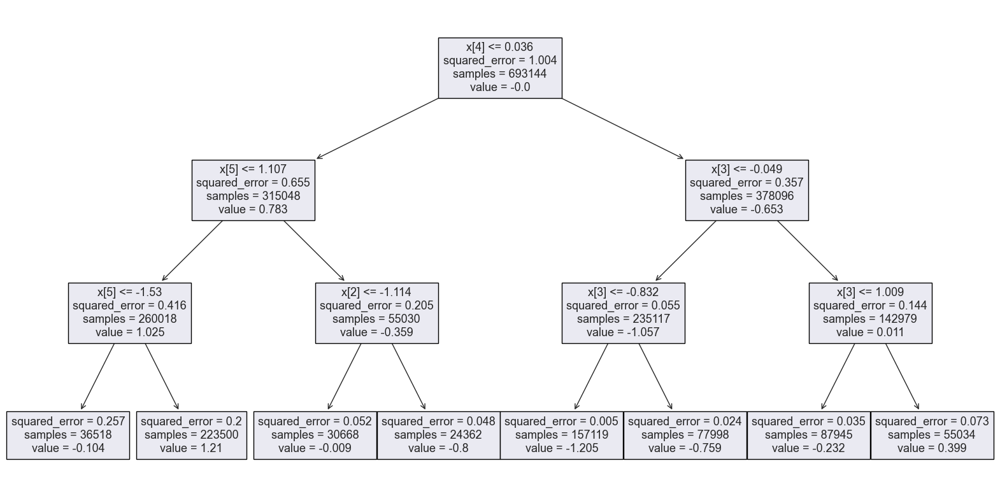

In [174]:
#ploting Decision Tree

plt.figure(figsize=(20, 10))
tree.plot_tree(DTmodel)
plt.show()

# Implementing Grid Search CV

In [177]:
# define the parameter grid
param_grid = {'max_depth': [1, 2, 3, 4, 5],
              'min_samples_split': [2, 4, 6, 8, 10]}

# create the grid search object
DTgrid_search = GridSearchCV(DTmodel, param_grid, cv=5)

# fit the grid search to the data
DTgrid_search.fit(X_train, Y_train)

# Get the Best Parameters
print("Best parameters:", DTgrid_search.best_params_)
print("Best score:", DTgrid_search.best_score_)

Best parameters: {'max_depth': 5, 'min_samples_split': 2}
Best score: 0.9610406600894315


# Implementing best parameters

In [181]:
#building model with hypermetune parameters
GridDTmodel = DecisionTreeRegressor(max_depth=5,splitter='best',random_state=10,max_features=None,min_samples_split= 2)
GridDTmodel.fit(X_train, Y_train)


DecisionTreeRegressor(max_depth=5, random_state=10)

In [183]:
GDY_pred=GridDTmodel.predict(X_test)

In [185]:
#Calculating The optimized values
GDmse = mean_squared_error(Y_test, GDY_pred)
print("Mean Squared Error:", GDmse)
GDmae = mean_absolute_error(Y_test, GDY_pred)
print("Mean Absolute Error:", GDmae)
GDr2 = r2_score(Y_test, GDY_pred)
print("R-squared:", r2)
GDRMSE=np.sqrt(GDmse)
print("RMSE:", GDRMSE)

Mean Squared Error: 0.03867504848421241
Mean Absolute Error: 0.11785457759045885
R-squared: 0.905109248256127
RMSE: 0.1966597276623061


In [187]:
Evaluation=pd.DataFrame(columns = ['Model', 'R_square', 'Mean_Squared_Error', 'Mean_Absolute_Error', 'Root_Mean_Squared_Error','Mean_Absolute_Percentage_Error'])

In [189]:
L2=["DecisionTreeRegressor", GDr2, GDmse, GDmae, GDRMSE,'Nan']
Evaluation.loc[len (Evaluation), :]=L2
Evaluation

,Model,R_square,Mean_Squared_Error,Mean_Absolute_Error,Root_Mean_Squared_Error,Mean_Absolute_Percentage_Error
0,DecisionTreeRegressor,0.961495,0.038675,0.117855,0.19666,Nan


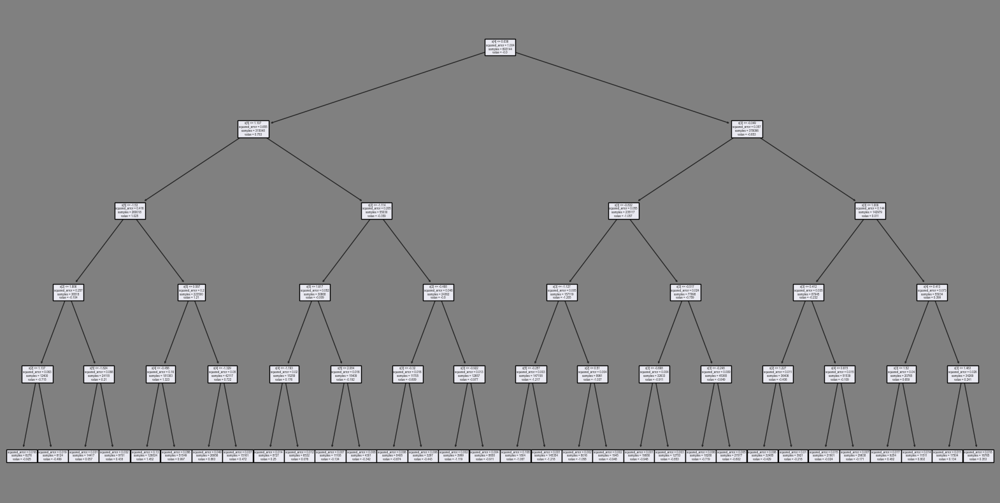

In [191]:
#Ploting again the optimized Decision Tree
plt.figure(figsize=(20, 10),facecolor='grey')
tree.plot_tree(GridDTmodel)
plt.show()

# Apply Random Forest Model

In [194]:
from sklearn.ensemble import RandomForestRegressor

RFmodel = RandomForestRegressor(max_depth=3, random_state=10, max_features='sqrt')
RFmodel.fit(X_train, Y_train)

RandomForestRegressor(max_depth=3, max_features='sqrt', random_state=10)

In [195]:
RFY_pred=RFmodel.predict(X_test)

In [198]:
# Calculate the mean squared error of the predictions
RFmse = mean_squared_error(Y_test, RFY_pred)
print("Mean Squared Error:", RFmse)

Mean Squared Error: 0.20526549621556592


In [200]:
# Calculate the mean Absolute Error of the prediction
RFmae = mean_absolute_error(Y_test, RFY_pred)
print("Mean Absolute Error:", RFmae)

Mean Absolute Error: 0.36203946327510694


In [202]:
# Calculate the Rsquare value of the prediction
RFr2 = r2_score(Y_test, RFY_pred)
print("R-squared:", RFr2)

R-squared: 0.7956362682699711


In [204]:
# Calculate root mean square error
RF_RMSE=np.sqrt(RFmse)
print("RMSE:", RF_RMSE)

RMSE: 0.4530623535624715


In [206]:
RF_MAPE=metrics.mean_absolute_percentage_error(Y_test,RFY_pred)
print("MAPE:",RF_MAPE)

MAPE: 1.3400226557538657


In [208]:
RandomForest_Results=pd.DataFrame({ 
'Attribute':['Regressor','MSE','MAE','R-Square','RMSE','Mape'],'Value':['RandomForest_Regressor',RFmse,RFmae,RFr2,RF_RMSE,RF_MAPE]})

In [210]:
RandomForest_Results

,Attribute,Value
0,Regressor,RandomForest_Regressor
1,MSE,0.205265
2,MAE,0.362039
3,R-Square,0.795636
4,RMSE,0.453062
5,Mape,1.340023


In [212]:
#get optmized result using randomized search parameter
Random_RF_Model = RandomForestRegressor(max_depth=20,
                                        n_estimators=75,
                                        min_samples_split=3,
                                        min_samples_leaf=3,
                                        random_state=0,
                                        max_features='sqrt')
Random_RF_Model.fit(X_train, Y_train) 

RandomForestRegressor(max_depth=20, max_features='sqrt', min_samples_leaf=3,
                      min_samples_split=3, n_estimators=75, random_state=0)

In [214]:
Random_RF_Y_predicted = Random_RF_Model.predict(X_test)

In [216]:
Random_RF_MSE = mean_squared_error(Y_test, Random_RF_Y_predicted)
Random_RF_RMSE = np.sqrt(Random_RF_MSE)
Random_RF_MAE = mean_absolute_error(Y_test, Random_RF_Y_predicted)
Random_RF_MAPE = mean_absolute_percentage_error(Y_test, Random_RF_Y_predicted)
Random_RF_r_score = r2_score(Y_test, Random_RF_Y_predicted)

# Apply Ada Boost Regression Model

In [219]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

# Create the base regressor
Base_Regressor = DecisionTreeRegressor(max_depth=5)

# Create the AdaBoost Regressor
Ada_Boost_Regressor = AdaBoostRegressor(base_estimator = Base_Regressor, n_estimators=100)

# Fit the regressor
Ada_Boost_Regressor.fit(X_train, Y_train)

# Predict using the AdaBoost regressor
Ada_Boost_Y_pred = Ada_Boost_Regressor.predict(X_test)

# Calculate the mean squared error
Ada_Bost_MSE = mean_squared_error(Y_test, Ada_Boost_Y_pred)

# Calculate the Root mean squared error
Ada_Bost_RMSE = np.sqrt(Ada_Bost_MSE)

# Calculate the mean absolutate error
Ada_Bost_MAE = mean_absolute_error(Y_test, Ada_Boost_Y_pred)

# Calculate the mean absolutate percentage error
Ada_Bost_MAPE = mean_absolute_percentage_error(Y_test, Ada_Boost_Y_pred)

# Calculate the R^2 (coefficient of determination) regression score
Ada_Boost_r2_Score = r2_score(Y_test, Ada_Boost_Y_pred)

# Creating the data frame for the results
Ada_Boost_Result = pd.DataFrame({"Attribute":["Ada_Bost_MSE","Ada_Bost_RMSE","Ada_Bost_MAE","Ada_Bost_MAPE",'Ada_Boost_r2_Score']
                                ,"Values":[Ada_Bost_MSE,Ada_Bost_RMSE,Ada_Bost_MAE,Ada_Bost_MAPE,Ada_Boost_r2_Score]})
Ada_Boost_Result

,Attribute,Values
0,Ada_Bost_MSE,0.009952
1,Ada_Bost_RMSE,0.099761
2,Ada_Bost_MAE,0.076879
3,Ada_Bost_MAPE,0.465990
4,Ada_Boost_r2_Score,0.990092


# Implementing Best Parameters

In [225]:

# Create the base regressor
Base_Regressor = DecisionTreeRegressor(max_depth=5)
# Create the AdaBoost Regressor
Random_Ada_Boost_Regressor = AdaBoostRegressor(base_estimator = Base_Regressor, n_estimators=75,learning_rate= 0.68)

# Fit the regressor
Random_Ada_Boost_Regressor.fit(X_train, Y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=5),
                  learning_rate=0.68, n_estimators=75)

In [227]:
# Predict using the AdaBoost regressor
Random_Ada_Boost_Y_pred = Random_Ada_Boost_Regressor.predict(X_test)

In [229]:
Random_Ada_Bost_MSE = mean_squared_error(Y_test, Random_Ada_Boost_Y_pred)
Random_Ada_Bost_RMSE = np.sqrt(Random_Ada_Bost_MSE)
Random_Ada_Bost_MAE = mean_absolute_error(Y_test, Random_Ada_Boost_Y_pred)
Random_Ada_Bost_MAPE = mean_absolute_percentage_error(Y_test, Random_Ada_Boost_Y_pred)
Random_Ada_Boost_r2_Score = r2_score(Y_test, Random_Ada_Boost_Y_pred)

In [231]:
L4=["Ada_Boosting", Random_Ada_Boost_r2_Score, Random_Ada_Bost_MSE, Random_Ada_Bost_MAE, Random_Ada_Bost_RMSE,Random_Ada_Bost_MAPE]
Evaluation.loc[len (Evaluation), :]=L4
Evaluation

,Model,R_square,Mean_Squared_Error,Mean_Absolute_Error,Root_Mean_Squared_Error,Mean_Absolute_Percentage_Error
0,DecisionTreeRegressor,0.961495,0.038675,0.117855,0.19666,Nan
1,Ada_Boosting,0.990594,0.009448,0.074173,0.0972,0.468328


# 4.5- Apply GradientBoost Regression Model

In [234]:
# Create the Gradient Boosting Regressor
Gradient_Boost_Model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3)

# Fit the regressor
Gradient_Boost_Model.fit(X_train, Y_train)

# Predict using the regressor
Gradient_Boost_Y_pred = Gradient_Boost_Model.predict(X_test)

# Calculate the mean squared error
Gradient_Boost_MSE = mean_squared_error(Y_test, Gradient_Boost_Y_pred)

# Calculate the Root mean squared error
Gradient_Boost_RMSE = np.sqrt(Gradient_Boost_MSE)

# Calculate the mean absolutate error
Gradient_Boost_MAE = mean_absolute_error(Y_test, Gradient_Boost_Y_pred)

# Calculate the mean absolutate percentage error
Gradient_Boost_MAPE = mean_absolute_percentage_error(Y_test, Gradient_Boost_Y_pred)

# Calculate the R^2 (coefficient of determination) regression score
Gradient_Boost_r2_Score = r2_score(Y_test, Gradient_Boost_Y_pred)

# Creating the data frame for the results
Gradient_Boost_Result = pd.DataFrame({"Attribute":["Gradient_Boost_MSE","Gradient_Boost_RMSE","Gradient_Boost_MAE","Gradient_Boost_MAPE",'Gradient_Boost_r2_Score']
                                ,"Values":[Gradient_Boost_MSE,Gradient_Boost_RMSE,Gradient_Boost_MAE,Gradient_Boost_MAPE,Gradient_Boost_r2_Score]})
Gradient_Boost_Result

,Attribute,Values
0,Gradient_Boost_MSE,0.004183
1,Gradient_Boost_RMSE,0.064673
2,Gradient_Boost_MAE,0.042206
3,Gradient_Boost_MAPE,0.467851
4,Gradient_Boost_r2_Score,0.995836


# Implementing Best Parameters

In [239]:
# Create the Gradient Boosting Regressor using Best Parameters
Random_Gradient_Boost_Model = GradientBoostingRegressor(n_estimators=100,min_samples_split=8,learning_rate=0.1, max_depth=6)


# Fit the regressor
Random_Gradient_Boost_Model.fit(X_train, Y_train)

# Predict using the regressor
Random_Gradient_Boost_Y_pred = Gradient_Boost_Model.predict(X_test)

In [241]:
Random_Gradient_Boost_MSE = mean_squared_error(Y_test, Random_Gradient_Boost_Y_pred)
Random_Gradient_Boost_RMSE = np.sqrt(Random_Gradient_Boost_MSE)
Random_Gradient_Boost_MAE = mean_absolute_error(Y_test, Random_Gradient_Boost_Y_pred)
Random_Gradient_Boost_MAPE = mean_absolute_percentage_error(Y_test, Random_Gradient_Boost_Y_pred)
Random_Gradient_Boost_r2_Score = r2_score(Y_test, Random_Gradient_Boost_Y_pred)


In [243]:
L5=["Gradient_Boosting", Random_Gradient_Boost_r2_Score, Random_Gradient_Boost_MSE, Random_Gradient_Boost_MAE, Random_Gradient_Boost_RMSE,Random_Gradient_Boost_MAPE]
Evaluation.loc[len (Evaluation), :]=L5
Evaluation

,Model,R_square,Mean_Squared_Error,Mean_Absolute_Error,Root_Mean_Squared_Error,Mean_Absolute_Percentage_Error
0,DecisionTreeRegressor,0.961495,0.038675,0.117855,0.19666,Nan
1,Ada_Boosting,0.990594,0.009448,0.074173,0.0972,0.468328
2,Gradient_Boosting,0.995836,0.004183,0.042206,0.064673,0.467851


# Apply Bagging Regression Model

In [246]:
# building the model
Bagg_Reg = DecisionTreeRegressor(random_state=10)
Bagging = BaggingRegressor(base_estimator=Bagg_Reg, n_estimators = 25, random_state= 10 )
Bagging.fit(X_train, Y_train)

# Predict using the Bagging regressor
Bagg_Reg_Y_Pred = Bagging.predict(X_test)

# Calculate the mean squared error
Bagging_Reg_MSE = mean_squared_error(Y_test, Bagg_Reg_Y_Pred)

# Calculate the Root mean squared error
Bagging_Reg_RMSE = np.sqrt(Bagging_Reg_MSE)

# Calculate the mean absolutate error
Bagging_Reg_MAE = mean_absolute_error(Y_test, Bagg_Reg_Y_Pred)

# Calculate the mean absolutate percentage error
Bagging_Reg_MAPE = mean_absolute_percentage_error(Y_test, Bagg_Reg_Y_Pred)

# Calculate the R^2 (coefficient of determination) regression score
Bagging_Reg_Score = r2_score(Y_test, Bagg_Reg_Y_Pred)

# Creating the data frame for the results
Bagging_Reg_Result = pd.DataFrame({"Attribute":["Bagging_Reg_MSE","Bagging_Reg_RMSE","Bagging_Reg_MAE","Bagging_Reg_MAPE",'Bagging_Reg_Score']
                                ,"Values":[Bagging_Reg_MSE,Bagging_Reg_RMSE,Bagging_Reg_MAE,Bagging_Reg_MAPE,Bagging_Reg_Score]})
Bagging_Reg_Result


,Attribute,Values
0,Bagging_Reg_MSE,0.000165
1,Bagging_Reg_RMSE,0.012864
2,Bagging_Reg_MAE,0.003846
3,Bagging_Reg_MAPE,0.027907
4,Bagging_Reg_Score,0.999835


# Implementing Best Parameters

In [249]:
#Random_Bagging = BaggingRegressor(base_estimator=Bagg_Reg,
                                 # n_estimators = 75,
                                  #random_state= None,
                                  #max_features=0.9,
                                  #max_samples=0.6,
                                  #n_jobs=-1
                                 #)
#Random_Bagging.fit(X_train, Y_train)
# Predict using the Bagging regressor
#Random_Bagg_Reg_Y_Pred = Bagging.predict(X_test)

from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor

Bagg_Reg = DecisionTreeRegressor()  # Ensure base estimator is defined

Random_Bagging = BaggingRegressor(
    estimator=Bagg_Reg, 
    n_estimators=30,  # Reduce number of estimators
    random_state=None,
    max_features=0.7,  # Reduce features to avoid memory overload
    max_samples=0.5,  # Reduce sample size
    n_jobs=4  # Limit parallel jobs
)

# Train the model
Random_Bagging.fit(X_train, Y_train)

# Predict
Random_Bagg_Reg_Y_Pred = Random_Bagging.predict(X_test)



In [251]:
Random_Bagging_Reg_MSE = mean_squared_error(Y_test, Random_Bagg_Reg_Y_Pred)
Random_Bagging_Reg_RMSE = np.sqrt(Random_Bagging_Reg_MSE)
Random_Bagging_Reg_MAE = mean_absolute_error(Y_test, Random_Bagg_Reg_Y_Pred)
Random_Bagging_Reg_MAPE = mean_absolute_percentage_error(Y_test, Random_Bagg_Reg_Y_Pred)
Random_Bagging_Reg_Score = r2_score(Y_test, Random_Bagg_Reg_Y_Pred)



In [253]:
L6=["Bagging", Random_Bagging_Reg_Score,Random_Bagging_Reg_MSE, Random_Bagging_Reg_MAE, Random_Bagging_Reg_RMSE,Random_Bagging_Reg_MAPE]
Evaluation.loc[len (Evaluation), :]=L6
Evaluation

,Model,R_square,Mean_Squared_Error,Mean_Absolute_Error,Root_Mean_Squared_Error,Mean_Absolute_Percentage_Error
0,DecisionTreeRegressor,0.961495,0.038675,0.117855,0.19666,Nan
1,Ada_Boosting,0.990594,0.009448,0.074173,0.0972,0.468328
2,Gradient_Boosting,0.995836,0.004183,0.042206,0.064673,0.467851
3,Bagging,0.998471,0.001536,0.017481,0.03919,0.147825


# As RandomForest is giving us the best Results, We'll choose RandomForest as our Final Model.

In [256]:
Random_RF_Model = RandomForestRegressor(max_depth=20,
                                        n_estimators=75,
                                        min_samples_split=3,
                                        min_samples_leaf=3,
                                        random_state=0,
                                        max_features='sqrt')
Random_RF_Model.fit(X, Y) 

RandomForestRegressor(max_depth=20, max_features='sqrt', min_samples_leaf=3,
                      min_samples_split=3, n_estimators=75, random_state=0)

In [258]:
import pickle

In [260]:
filename = 'trained_model.sav'
pickle.dump(Random_RF_Model, open(filename, 'wb'))

In [262]:
loaded_model = pickle.load(open('trained_model.sav', 'rb'))

In [264]:
input_data = (0.22,0.576,0.567,0.444,0.768,0.892,0.654,0.4356)

input_data_asarray = np.asarray(input_data)

input_data_reshaped = input_data_asarray.reshape(1,-1)



In [266]:
prediction = loaded_model.predict(input_data_reshaped)
print(prediction)

[-0.36183517]
